In [1]:
# Cell 1 - Install & imports
!pip install --quiet ultralytics timm

import os, json, shutil, glob, math, io
import cv2
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn.functional as F
from torchvision import transforms, models
import torch.nn as nn

from ultralytics import YOLO
import tqdm

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Use standard ImageNet mean/std (safe fallback)
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

print("Cell 1 done")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 57.7 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 66.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 28.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 28.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 75.9 MB/s eta 0:00:00:00:0100:01
Creating new Ultra

In [2]:
# Cell 2 - Load classes (labels.csv or classes.txt) and model checkpoint robustly

# --- locate classes ---

csv_path = '/kaggle/input/lablesofbreed/labels (1).csv'

if csv_path:
    df_labels = pd.read_csv(csv_path)
    classes = sorted(df_labels['breed'].unique().tolist())
    print(f"Loaded {len(classes)} classes from {csv_path}")
else:
    # try classes.txt
    classes_txt = next((p for p in ['./classes.txt','/kaggle/working/classes.txt','./classes.txt'] if os.path.exists(p)), None)
    if classes_txt:
        with open(classes_txt,'r') as f:
            classes = [l.strip() for l in f if l.strip()]
            print(f"Loaded {len(classes)} classes from {classes_txt}")
    else:
        raise FileNotFoundError("labels.csv or classes.txt not found. Provide class list before running inference.")

idx2label = {i:lab for i,lab in enumerate(classes)}
label2idx = {lab:i for i,lab in idx2label.items()}

# --- build model architecture (EfficientNet-B3) ---
num_classes = len(classes)
model = models.efficientnet_b3(weights=None)   # no auto-download of weights
# Replace classifier head
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

# --- robust loader ---
best_model_path = '/kaggle/input/cow_breed_classification_12_breeds_by_arpit/pytorch/default/1/best_model (2).pth'  # change if different
if not os.path.exists(best_model_path):
    raise FileNotFoundError(f"Checkpoint not found at {best_model_path}. Upload the file to the notebook workspace.")

def load_state_dict_robust(model, path, device):
    state = torch.load(path, map_location=device)
    # unwrap common checkpoint formats
    if isinstance(state, dict) and 'state_dict' in state:
        state = state['state_dict']
    # state could be the actual dict already
    if not isinstance(state, dict):
        raise RuntimeError("Unrecognized checkpoint format.")
    # strip 'module.' if present
    new_state = {}
    for k,v in state.items():
        new_k = k
        if k.startswith('module.'):
            new_k = k[len('module.'):]
        new_state[new_k] = v
    model.load_state_dict(new_state, strict=True)
    return model

model = load_state_dict_robust(model, best_model_path, device)
model = model.to(device)
model.eval()
print("Model loaded and set to eval()")
print("Cell 2 done")


Loaded 12 classes from /kaggle/input/lablesofbreed/labels (1).csv
Model loaded and set to eval()
Cell 2 done


In [3]:
# Cell 3 - YOLO load and detect/crop helper

yolo_weights = 'yolov8n.pt'   # replace with your detector weights if you have them
yolo_model = YOLO(yolo_weights)
yolo_device = str(device)     # 'cuda:0' or 'cpu'
print("Loaded YOLO:", yolo_weights)

def detect_and_crop_yolo(image_path, choose_largest=True, min_score=0.15, fallback_center=True, center_size=0.8):
    """
    Returns: crop_pil, bbox (x1,y1,x2,y2), detection_score, orig_pil
    If no detection and fallback_center=True, returns a centered crop (square) covering center_size fraction.
    """
    orig = Image.open(image_path).convert('RGB')
    # run detection (ultralytics accepts PIL)
    results = yolo_model.predict(orig, device=yolo_device, verbose=False)
    r = results[0]
    boxes = r.boxes.xyxy.cpu().numpy() if len(r.boxes) > 0 else np.array([])
    scores = r.boxes.conf.cpu().numpy() if len(r.boxes) > 0 else np.array([])

    if boxes.shape[0] == 0 or scores.max() < min_score:
        if fallback_center:
            W, H = orig.size
            crop_w = int(W * center_size)
            crop_h = int(H * center_size)
            x1 = (W - crop_w)//2
            y1 = (H - crop_h)//2
            x2 = x1 + crop_w
            y2 = y1 + crop_h
            crop = orig.crop((x1,y1,x2,y2))
            return crop, (x1,y1,x2,y2), 0.0, orig
        else:
            return None, None, None, orig

    # choose box (largest by area or highest score)
    if choose_largest:
        areas = (boxes[:,2]-boxes[:,0]) * (boxes[:,3]-boxes[:,1])
        idx = int(np.argmax(areas))
    else:
        idx = int(np.argmax(scores))

    x1,y1,x2,y2 = boxes[idx].astype(int).tolist()
    score = float(scores[idx])
    # clamp coords
    W, H = orig.size
    x1 = max(0, min(x1, W-1)); x2 = max(0, min(x2, W))
    y1 = max(0, min(y1, H-1)); y2 = max(0, min(y2, H))
    crop = orig.crop((x1,y1,x2,y2))
    return crop, (x1,y1,x2,y2), score, orig

print("detect_and_crop_yolo ready")
print("Cell 3 done")


Loaded YOLO: yolov8n.pt
detect_and_crop_yolo ready
Cell 3 done


In [4]:
# Cell 4 - Preprocessing: resize to 300x300 + normalization and tensor helper
preprocess = transforms.Compose([
    transforms.Resize((300,300)),
    transforms.ToTensor(),
])

def prepare_tensor_from_pil(pil_img, device=device):
    """
    Input: PIL.Image (RGB)
    Output: tensor on device shaped (1,C,H,W)
    """
    x = preprocess(pil_img).unsqueeze(0).to(device)
    return x

print("Preprocess ready (300x300 + ImageNet norm)")
print("Cell 4 done")


Preprocess ready (300x300 + ImageNet norm)
Cell 4 done


In [5]:
# Cell 5 - Single-image inference pipeline (detect -> preprocess -> predict -> topk)
def predict_image(image_path, topk=3, confidence_threshold_for_review=0.5):
    """
    Returns a dict with:
      - topk_labels, topk_probs, topk_idx
      - detection bbox & score
      - ask_expert boolean if top-1 prob < threshold
      - crop_pil, orig_pil
    """
    crop, bbox, det_score, orig = detect_and_crop_yolo(image_path)
    if crop is None:
        return {'error':'no_detection', 'message':'No detection and no fallback crop', 'orig':orig}

    x = prepare_tensor_from_pil(crop, device)
    with torch.no_grad():
        logits = model(x)            # shape [1, num_classes]
        probs = F.softmax(logits, dim=1).cpu().numpy()[0]

    topk_idx = probs.argsort()[::-1][:topk].tolist()
    topk_probs = [float(probs[i]) for i in topk_idx]
    topk_labels = [idx2label[i] for i in topk_idx]

    ask_expert = topk_probs[0] < confidence_threshold_for_review

    return {
        'image_path': image_path,
        'bbox': bbox,
        'detection_score': det_score,
        'topk_idx': topk_idx,
        'topk_labels': topk_labels,
        'topk_probs': topk_probs,
        'ask_expert': ask_expert,
        'crop_pil': crop,
        'orig_pil': orig
    }

print("predict_image ready")
print("Cell 5 done")


predict_image ready
Cell 5 done


In [6]:
# Cell 6 - Grad-CAM: register hooks and generator
_gradcam_activations = None
_gradcam_gradients = None
_gradcam_handles = []

def register_gradcam_hooks(model, target_module=None):
    """
    Registers forward/backward hooks on target_module.
    If target_module is None, uses model.features[-1].
    Re-registering will remove previous hooks cleanly.
    """
    global _gradcam_handles, _gradcam_activations, _gradcam_gradients
    # remove old
    for h in _gradcam_handles:
        try:
            h.remove()
        except Exception:
            pass
    _gradcam_handles = []
    _gradcam_activations = None
    _gradcam_gradients = None

    if target_module is None:
        target_module = model.features[-1]   # default

    def _forward_hook(module, inp, out):
        global _gradcam_activations
        _gradcam_activations = out.detach()

    def _backward_hook(module, grad_in, grad_out):
        global _gradcam_gradients
        # grad_out is tuple, take first
        _gradcam_gradients = grad_out[0].detach()

    h_fwd = target_module.register_forward_hook(_forward_hook)
    # prefer full backward hook if available
    if hasattr(target_module, "register_full_backward_hook"):
        h_bwd = target_module.register_full_backward_hook(lambda m, gi, go: _backward_hook(m, gi, go))
    else:
        h_bwd = target_module.register_backward_hook(_backward_hook)

    _gradcam_handles.extend([h_fwd, h_bwd])
    print("Hooks registered on:", target_module)

def generate_gradcam_overlay(crop_pil, class_idx, blend_alpha=0.5, return_heatmap_uint8=False):
    """
    Compute Grad-CAM for crop_pil and class_idx.
    Returns: heatmap (float HxW 0..1), overlay_pil (RGB)
    """
    global _gradcam_activations, _gradcam_gradients
    _gradcam_activations = None
    _gradcam_gradients = None

    x = prepare_tensor_from_pil(crop_pil, device)
    x.requires_grad = True

    logits = model(x)  # forward
    score = logits[0, class_idx]
    model.zero_grad()
    score.backward(retain_graph=True)

    if _gradcam_activations is None or _gradcam_gradients is None:
        raise RuntimeError("Grad-CAM hooks didn't capture activations/gradients. Re-register hooks on current model instance.")

    acts = _gradcam_activations   # (1,C,H,W)
    grads = _gradcam_gradients    # (1,C,H,W)
    weights = grads.mean(dim=(2,3), keepdim=True)   # (1,C,1,1)
    gcam = (weights * acts).sum(dim=1, keepdim=True)   # (1,1,H,W)
    gcam = torch.relu(gcam)
    gcam = gcam.squeeze().cpu().numpy()
    gcam -= gcam.min()
    if gcam.max() > 0:
        gcam = gcam / gcam.max()
    heatmap = gcam   # float 0..1

    # resize to crop size & colorize
    W, H = crop_pil.size
    heat_uint8 = (heatmap * 255).astype(np.uint8)
    heat_resized = cv2.resize(heat_uint8, (W, H))
    heat_color = cv2.applyColorMap(heat_resized, cv2.COLORMAP_JET)
    heat_color = cv2.cvtColor(heat_color, cv2.COLOR_BGR2RGB)

    crop_np = np.array(crop_pil).astype(np.float32)
    overlay = (1.0 - blend_alpha) * crop_np + blend_alpha * heat_color.astype(np.float32)
    overlay = np.clip(overlay, 0, 255).astype(np.uint8)
    overlay_pil = Image.fromarray(overlay)

    if return_heatmap_uint8:
        return heatmap, overlay_pil, heat_resized
    return heatmap, overlay_pil

# (re-)register hooks now
register_gradcam_hooks(model)
print("Grad-CAM setup complete")
print("Cell 6 done")


Hooks registered on: Conv2dNormActivation(
  (0): Conv2d(384, 1536, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (1): BatchNorm2d(1536, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): SiLU(inplace=True)
)
Grad-CAM setup complete
Cell 6 done


Found 15 images in folder/subfolders.

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Brown_Swiss/images (40).jpeg ...
Detection bbox: (94, 86, 433, 315) YOLO score: 0.905336320400238
Top-1: Brown_Swiss (63.74%)


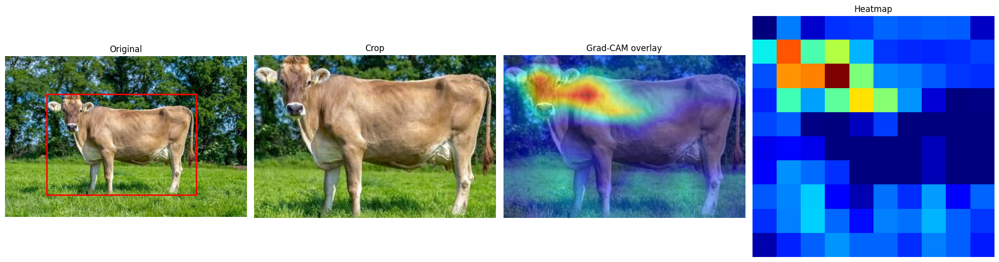

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Brown_Swiss/images (40).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Brown_Swiss/images (39).jpeg ...
Detection bbox: (23, 12, 528, 331) YOLO score: 0.8859548568725586
Top-1: Brown_Swiss (78.66%)


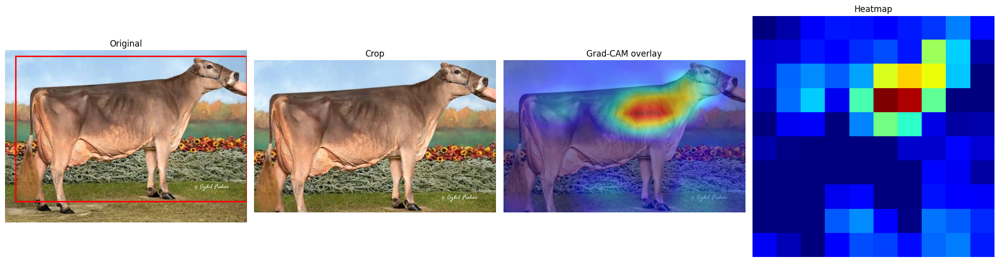

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Brown_Swiss/images (39).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Brown_Swiss/images (41).jpeg ...
Detection bbox: (52, 47, 391, 409) YOLO score: 0.8946303725242615
Top-1: Brown_Swiss (36.57%)
🔴 Confidence < 50% — ASK EXPERT REVIEW


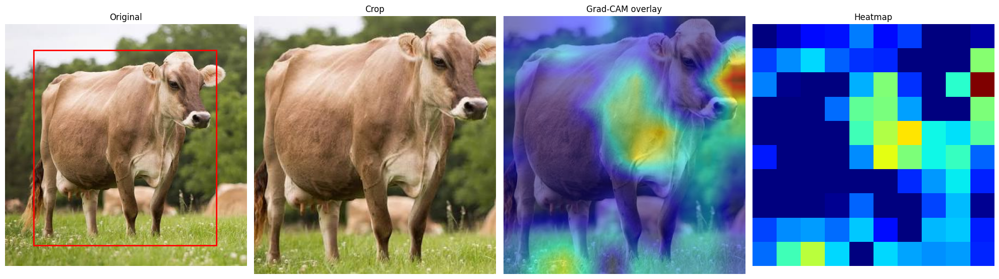

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Brown_Swiss/images (41).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Hallikar/images (40).jpeg ...
Detection bbox: (75, 0, 250, 187) YOLO score: 0.910356342792511
Top-1: Hallikar (88.86%)


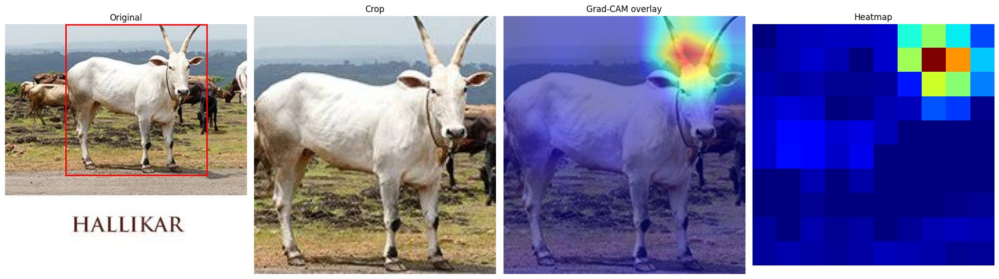

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Hallikar/images (40).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Hallikar/images (39).jpeg ...
Detection bbox: (23, 21, 208, 191) YOLO score: 0.0
Top-1: Hallikar (94.07%)


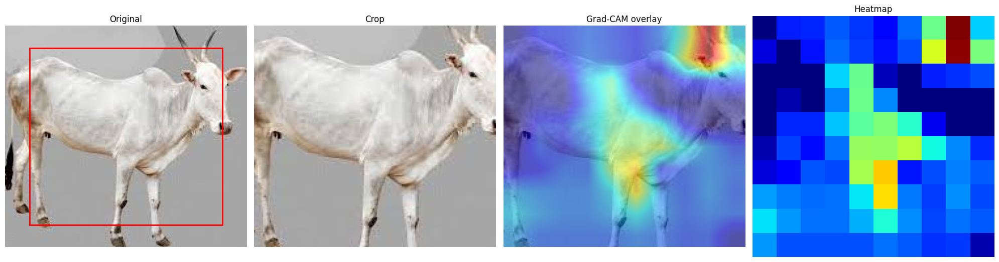

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Hallikar/images (39).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Hallikar/images (41).jpeg ...
Detection bbox: (49, 45, 148, 133) YOLO score: 0.6473174691200256
Top-1: Hallikar (50.90%)


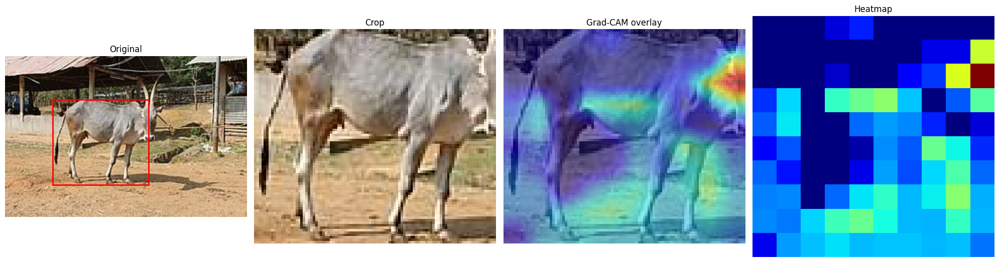

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Hallikar/images (41).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Ayrshire/images (40).jpeg ...
Detection bbox: (55, 63, 459, 278) YOLO score: 0.9057850241661072
Top-1: Ayrshire (74.88%)


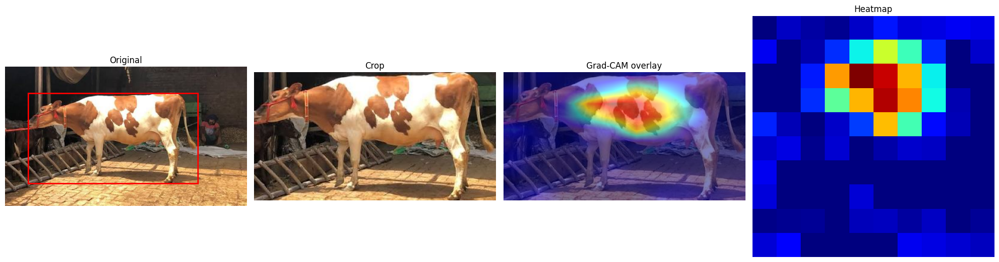

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Ayrshire/images (40).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Ayrshire/images (39).jpeg ...
Detection bbox: (46, 70, 392, 380) YOLO score: 0.878612220287323
Top-1: Ayrshire (54.57%)


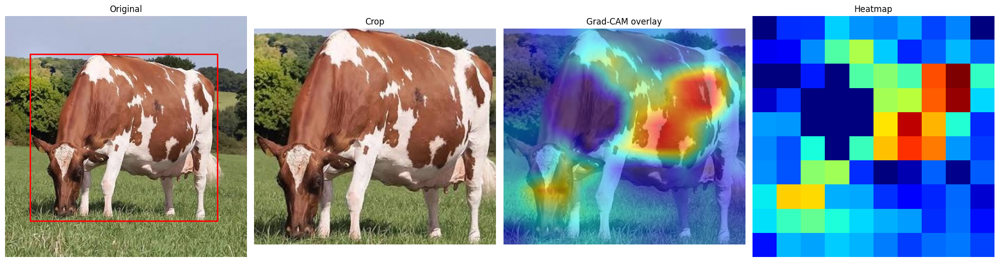

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Ayrshire/images (39).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Ayrshire/images (41).jpeg ...
Detection bbox: (22, 51, 220, 177) YOLO score: 0.5156339406967163
Top-1: Holstein_Friesian (63.67%)


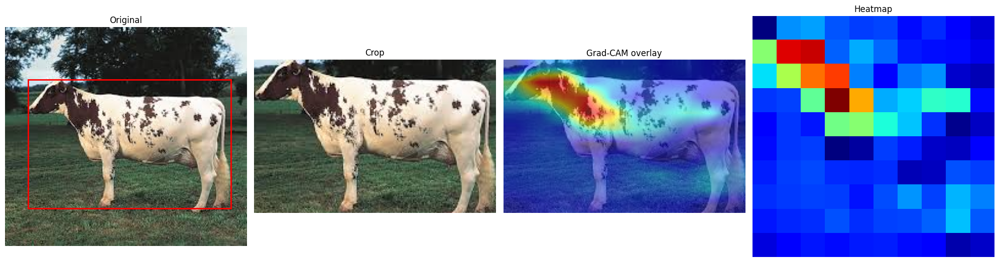

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Ayrshire/images (41).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Holstein_Friesian/images (40).jpeg ...
Detection bbox: (18, 6, 570, 388) YOLO score: 0.8607833981513977
Top-1: Holstein_Friesian (92.79%)


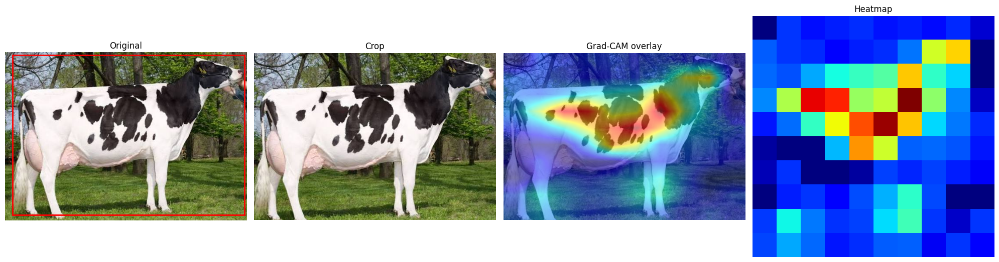

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Holstein_Friesian/images (40).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Holstein_Friesian/images (39).jpeg ...
Detection bbox: (165, 122, 427, 300) YOLO score: 0.912385880947113
Top-1: Holstein_Friesian (90.71%)


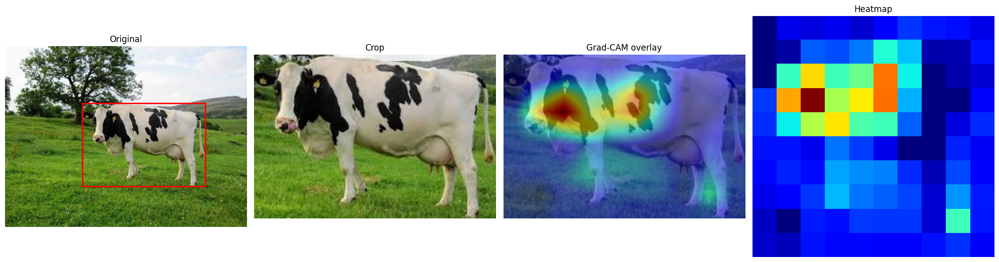

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Holstein_Friesian/images (39).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Holstein_Friesian/images (41).jpeg ...
Detection bbox: (6, 63, 422, 369) YOLO score: 0.9481033682823181
Top-1: Holstein_Friesian (88.74%)


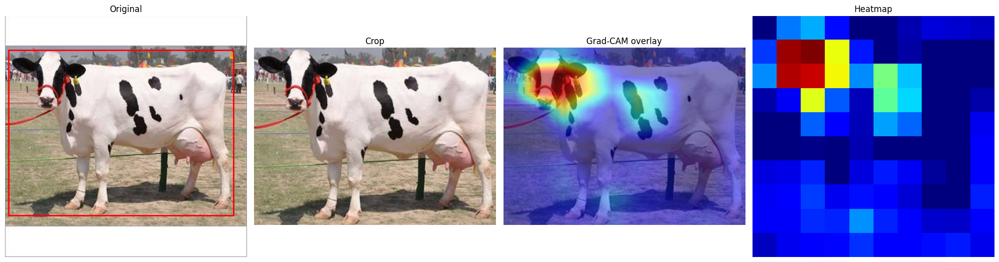

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Holstein_Friesian/images (41).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Gir/images (40).jpeg ...
Detection bbox: (7, 202, 521, 552) YOLO score: 0.8042503595352173
Top-1: Gir (85.95%)


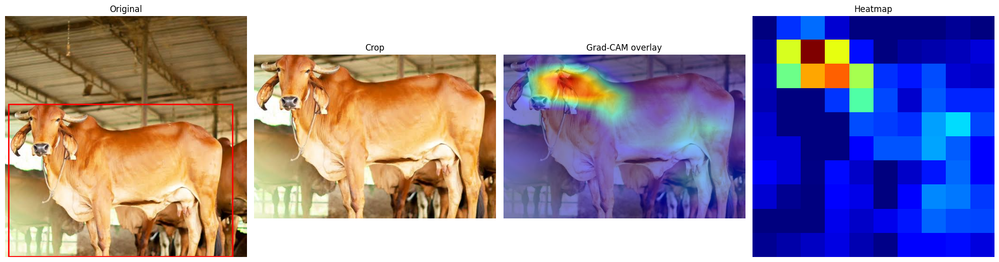

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Gir/images (40).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Gir/images (39).jpeg ...
Detection bbox: (135, 2, 659, 431) YOLO score: 0.9444767236709595
Top-1: Gir (99.61%)


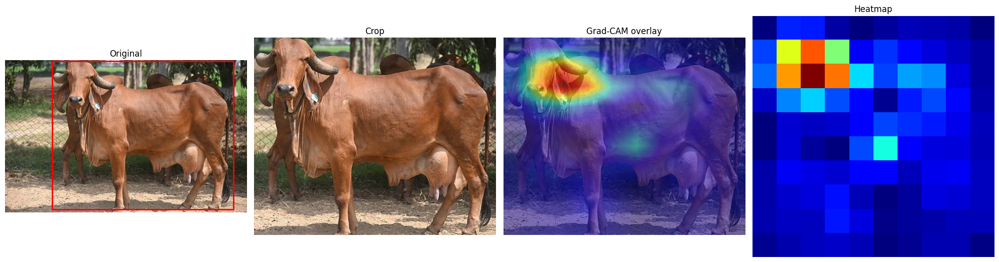

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Gir/images (39).jpeg

Processing /kaggle/input/test-breed/Cow_test_breed_classification/Gir/images (41).jpeg ...
Detection bbox: (1, 0, 498, 381) YOLO score: 0.8931043744087219
Top-1: Gir (61.03%)


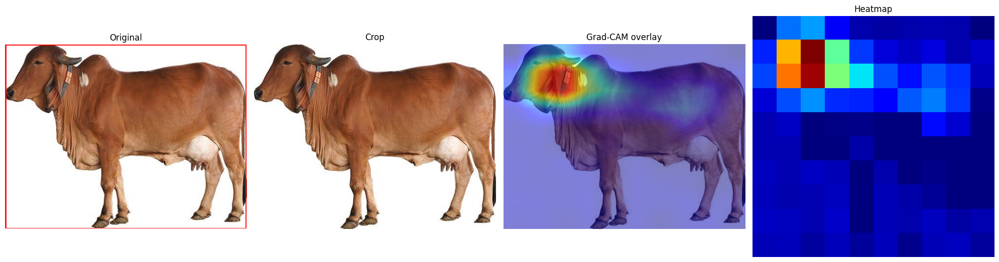

Saved overlay + heatmap + metadata for /kaggle/input/test-breed/Cow_test_breed_classification/Gir/images (41).jpeg

All images processed. Outputs saved in /kaggle/working/inference_outputs


In [11]:
# Cell 7 - Run prediction + Grad-CAM for all images in folder + subfolders
test_root_folder = '/kaggle/input/test-breed'  # <-- root folder containing breed subfolders

if not os.path.exists(test_root_folder):
    raise FileNotFoundError(f"Test folder not found at {test_root_folder}.")

# Prepare output folder
out_dir = '/kaggle/working/inference_outputs'
os.makedirs(out_dir, exist_ok=True)

# Recursively find all image files
img_files = []
for root, dirs, files in os.walk(test_root_folder):
    for f in files:
        if f.lower().endswith(('.jpg','.jpeg','.png')):
            img_files.append(os.path.join(root, f))

if not img_files:
    raise FileNotFoundError(f"No images found under {test_root_folder}.")

print(f"Found {len(img_files)} images in folder/subfolders.")

for img_path in img_files:
    print(f"\nProcessing {img_path} ...")
    
    res = predict_image(img_path, topk=3, confidence_threshold_for_review=0.5)
    
    if 'error' in res:
        print("Error:", res.get('message'))
        continue
    
    print("Detection bbox:", res['bbox'], "YOLO score:", res['detection_score'])
    print("Top-1:", res['topk_labels'][0], f"({res['topk_probs'][0]*100:.2f}%)")
    if res['ask_expert']:
        print("🔴 Confidence < 50% — ASK EXPERT REVIEW")
    
    # Grad-CAM for top-1
    class_idx = int(res['topk_idx'][0])
    heatmap, overlay_pil = generate_gradcam_overlay(res['crop_pil'], class_idx, blend_alpha=0.5)
    
    # Plot original (with bbox), crop, overlay & heatmap
    fig, axs = plt.subplots(1,4, figsize=(20,6))
    axs[0].imshow(res['orig_pil']); axs[0].set_title("Original"); axs[0].axis('off')
    try:
        x1,y1,x2,y2 = res['bbox']
        axs[0].add_patch(plt.Rectangle((x1,y1), x2-x1, y2-y1, edgecolor='red', facecolor='none', lw=2))
    except Exception:
        pass
    axs[1].imshow(res['crop_pil']); axs[1].set_title("Crop"); axs[1].axis('off')
    axs[2].imshow(overlay_pil); axs[2].set_title("Grad-CAM overlay"); axs[2].axis('off')
    axs[3].imshow(heatmap, cmap='jet', vmin=0, vmax=1); axs[3].set_title("Heatmap"); axs[3].axis('off')
    plt.tight_layout()
    plt.show()
    
    # Save outputs
    base = os.path.splitext(os.path.basename(img_path))[0]
    overlay_pil.save(os.path.join(out_dir, f"{base}_gradcam_overlay.png"))
    heat_uint8 = (heatmap * 255).astype(np.uint8)
    cv2.imwrite(os.path.join(out_dir, f"{base}_gradcam_heatmap.png"),
                cv2.cvtColor(cv2.resize(heat_uint8, res['crop_pil'].size), cv2.COLOR_GRAY2BGR))
    with open(os.path.join(out_dir, f"{base}_metadata.json"), 'w') as f:
        json.dump({
            'image': img_path,
            'bbox': res['bbox'],
            'detection_score': res['detection_score'],
            'topk_labels': res['topk_labels'],
            'topk_probs': res['topk_probs'],
            'ask_expert': res['ask_expert']
        }, f, indent=2)
    print(f"Saved overlay + heatmap + metadata for {img_path}")

print("\nAll images processed. Outputs saved in", out_dir)


In [13]:
# Cell 8 - Grad-CAM top-3 visualization for all images in folder/subfolders
test_root_folder = '/kaggle/input/cow-test'  # <-- root folder containing breed subfolders

# Recursively find all images
img_files = []
for root, dirs, files in os.walk(test_root_folder):
    for f in files:
        if f.lower().endswith(('.jpg','.jpeg','.png')):
            img_files.append(os.path.join(root, f))

print(f"Found {len(img_files)} images.")

for img_path in img_files:
    print(f"\nProcessing {img_path} ...")
    res = predict_image(img_path, topk=3, confidence_threshold_for_review=0.5)
    
    if 'error' in res:
        print("Prediction error:", res.get('message'))
        continue
    
    crop_pil = res['crop_pil']
    topk_idx = res['topk_idx']
    topk_labels = res['topk_labels']
    topk_probs  = res['topk_probs']

    n = min(3, len(topk_idx))
    fig, axes = plt.subplots(1, n+1, figsize=(4*(n+1), 4))
    axes[0].imshow(crop_pil); axes[0].set_title("Input crop"); axes[0].axis('off')

    for i in range(n):
        class_idx = int(topk_idx[i])
        heatmap, overlay_pil = generate_gradcam_overlay(crop_pil, class_idx, blend_alpha=0.5)
        axes[i+1].imshow(overlay_pil)
        axes[i+1].set_title(f"{topk_labels[i]}\n({topk_probs[i]*100:.1f}%)")
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()
    print(f"Top-1: {topk_labels[0]} ({topk_probs[0]*100:.2f}%)")
    if res['ask_expert']:
        print("🔴 Confidence < 50% — ASK EXPERT REVIEW")

print("Cell 8 done")


Found 0 images.
Cell 8 done


In [14]:
# Cell 9: install & imports for ipywidgets UI (run once)
!pip install --quiet ipywidgets

import io, os, json, shutil
from IPython.display import display, clear_output
import ipywidgets as widgets
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import numpy as np

print("ipywidgets imported. Now run the UI cell (next).")


ipywidgets imported. Now run the UI cell (next).


In [15]:
# Cell 10: Interactive UI for single image upload + Grad-CAM + preview + save
import ipywidgets as widgets
from IPython.display import display, clear_output
from PIL import Image
import matplotlib.pyplot as plt
import os, shutil, json, cv2, numpy as np

# --- Widgets ---
upload = widgets.FileUpload(accept='image/*', multiple=False, description="Upload Image")
path_input = widgets.Text(value='', placeholder='/kaggle/working/test.jpg', description='Or path:')
run_btn = widgets.Button(description="Run Inference", button_style='success', tooltip="Run YOLO + Grad-CAM")
save_btn = widgets.Button(description="Save Outputs", button_style='info', tooltip="Save overlay, heatmap, metadata")
top_choice = widgets.Dropdown(options=['Top-1'], description='Grad-CAM for:')
alpha_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.05, description='Blend α:')
true_label = widgets.Text(description="True Label:", placeholder="optional: Gir, Sahiwal...")
preview_out = widgets.Output(layout={'border': '1px solid gray'})
out = widgets.Output(layout={'border': '1px solid black'})

# Layout
controls = widgets.HBox([upload, path_input])
options = widgets.HBox([top_choice, alpha_slider, true_label, run_btn, save_btn])
ui = widgets.VBox([controls, preview_out, options, out])
display(ui)

# --- Internal state ---
_last_result = None
_last_overlay = None
_last_heatmap = None
_last_inference_path = None

# --- Helper functions ---
def _save_upload_to_path(upload_widget, dest_dir='/kaggle/working'):
    """Save uploaded file and return path. If no upload, return None."""
    if not upload_widget.value:
        return None

    try:
        uploaded_item = list(upload_widget.value.values())[0] if isinstance(upload_widget.value, dict) else upload_widget.value[0]
        content = uploaded_item['content'] if isinstance(uploaded_item, dict) else uploaded_item['content']
        fname = uploaded_item['name'] if isinstance(uploaded_item, dict) else 'uploaded.jpg'
        dest_path = os.path.join(dest_dir, fname)
        with open(dest_path, 'wb') as f:
            f.write(content)
        return dest_path
    except Exception as e:
        with preview_out:
            print("❌ Error saving uploaded file:", e)
        return None

def _preview_image(change=None):
    """Show preview of uploaded image."""
    preview_out.clear_output()
    img_path = _save_upload_to_path(upload)
    if img_path is None:
        return
    try:
        img = Image.open(img_path).convert('RGB')
        with preview_out:
            print(f"✅ Uploaded: {os.path.basename(img_path)} | Size: {img.size}")
            display(img)
    except Exception as e:
        with preview_out:
            print("❌ Error loading image:", e)

def _choose_input_path():
    """Return path chosen by user: upload > manual path."""
    uploaded_path = _save_upload_to_path(upload)
    if uploaded_path:
        return uploaded_path
    manual = path_input.value.strip()
    if manual and os.path.exists(manual):
        return manual
    elif manual:
        with out:
            print(f"⚠️ Manual path does not exist: {manual}")
    return None

def _update_top_choices(res):
    if not res or 'topk_labels' not in res:
        top_choice.options = ['Top-1']
        top_choice.value = 'Top-1'
        return
    opts = [f"Top-{i+1}: {lbl} ({res['topk_probs'][i]*100:.1f}%)" for i, lbl in enumerate(res['topk_labels'])]
    top_choice.options = opts
    top_choice.value = opts[0]

# --- Core functions ---
def _run_inference(_=None):
    out.clear_output()
    global _last_result, _last_overlay, _last_heatmap, _last_inference_path

    img_path = _choose_input_path()
    if img_path is None:
        with out:
            print("Upload an image or enter a valid path first.")
        return

    # Check required globals
    missing = [name for name in ('predict_image','generate_gradcam_overlay','register_gradcam_hooks','model') if name not in globals()]
    if missing:
        with out:
            print("Missing required objects/functions:", missing)
            print("Run Cells 1-8 first.")
        return

    # Re-register hooks for Grad-CAM
    try:
        register_gradcam_hooks(model)
    except Exception as e:
        with out:
            print("⚠️ Could not register Grad-CAM hooks:", e)

    with out:
        print("⏳ Running YOLO -> Model inference ...")

    try:
        res = predict_image(img_path, topk=3, confidence_threshold_for_review=0.5)
    except Exception as e:
        with out:
            print("❌ Error during predict_image():", e)
        return

    _last_result = res
    _last_inference_path = img_path
    _update_top_choices(res)

    if 'error' in res:
        with out:
            clear_output()
            print("Prediction error:", res.get('message'))
            if res.get('orig'):
                display(res.get('orig'))
        return

    # Grad-CAM overlay
    top_idx = int(res['topk_idx'][0])
    blend_alpha = float(alpha_slider.value)
    try:
        heatmap, overlay_pil = generate_gradcam_overlay(res['crop_pil'], top_idx, blend_alpha=blend_alpha)
    except Exception as e:
        with out:
            print("❌ Error generating Grad-CAM:", e)
        return

    _last_overlay, _last_heatmap = overlay_pil, heatmap

    # Display results
    with out:
        clear_output()
        print(f"Image: {img_path}")
        print("Detection bbox:", res.get('bbox'), "| YOLO score:", res.get('detection_score'))
        print("Top predictions:")
        for lbl, p in zip(res['topk_labels'], res['topk_probs']):
            print(f" - {lbl}: {p*100:.2f}%")
        if res.get('ask_expert'):
            print("🔴 Confidence < 50% — ASK EXPERT REVIEW")

        gt = true_label.value.strip()
        if gt:
            if gt in res['topk_labels']:
                rank = res['topk_labels'].index(gt)+1
                print(f"✅ True label '{gt}' found at rank {rank}")
            else:
                print(f"❌ True label '{gt}' not in Top-3 predictions")

        # Show images
        fig, axes = plt.subplots(1,4, figsize=(18,5))
        axes[0].imshow(res['orig_pil']); axes[0].set_title("Original"); axes[0].axis('off')
        try:
            x1,y1,x2,y2 = res['bbox']
            axes[0].add_patch(plt.Rectangle((x1,y1), x2-x1, y2-y1, edgecolor='red', facecolor='none', lw=2))
        except: pass
        axes[1].imshow(res['crop_pil']); axes[1].set_title("Crop"); axes[1].axis('off')
        axes[2].imshow(overlay_pil); axes[2].set_title("Grad-CAM overlay"); axes[2].axis('off')
        axes[3].imshow(heatmap, cmap='jet', vmin=0, vmax=1); axes[3].set_title("Heatmap"); axes[3].axis('off')
        plt.show()

def _on_option_change(change):
    if _last_result is None:
        return
    out.clear_output()
    sel_display = change['new']
    selected_index = 0
    for i, lbl in enumerate(_last_result['topk_labels']):
        display_str = f"Top-{i+1}: {lbl} ({_last_result['topk_probs'][i]*100:.1f}%)"
        if sel_display == display_str:
            selected_index = i
            break

    class_idx = int(_last_result['topk_idx'][selected_index])
    blend_alpha = float(alpha_slider.value)
    try:
        heatmap, overlay_pil = generate_gradcam_overlay(_last_result['crop_pil'], class_idx, blend_alpha=blend_alpha)
    except Exception as e:
        with out:
            print("❌ Error re-generating Grad-CAM:", e)
        return

    global _last_overlay, _last_heatmap
    _last_overlay, _last_heatmap = overlay_pil, heatmap

    with out:
        clear_output()
        print("Updated Grad-CAM for:", _last_result['topk_labels'][selected_index])
        gt = true_label.value.strip()
        if gt:
            if gt in _last_result['topk_labels']:
                rank = _last_result['topk_labels'].index(gt)+1
                print(f"✅ True label '{gt}' found at rank {rank}")
            else:
                print(f"❌ True label '{gt}' not in Top-3 predictions")
        fig, axes = plt.subplots(1,3, figsize=(14,5))
        axes[0].imshow(_last_result['crop_pil']); axes[0].set_title("Crop"); axes[0].axis('off')
        axes[1].imshow(overlay_pil); axes[1].set_title("Grad-CAM overlay"); axes[1].axis('off')
        axes[2].imshow(heatmap, cmap='jet', vmin=0, vmax=1); axes[2].set_title("Heatmap"); axes[2].axis('off')
        plt.show()

def _save_outputs(_=None):
    if _last_result is None or _last_overlay is None:
        with out:
            print("Nothing to save. Run inference first.")
        return
    out_dir = '/kaggle/working/inference_outputs'
    os.makedirs(out_dir, exist_ok=True)
    src_path = _last_inference_path
    base = os.path.splitext(os.path.basename(src_path))[0]

    try:
        shutil.copy2(src_path, os.path.join(out_dir, f"{base}_orig.jpg"))
    except:
        _last_result['orig_pil'].save(os.path.join(out_dir, f"{base}_orig.jpg"))

    _last_overlay.save(os.path.join(out_dir, f"{base}_gradcam_overlay.png"))
    heat_uint8 = (_last_heatmap*255).astype('uint8')
    cv2.imwrite(os.path.join(out_dir, f"{base}_gradcam_heatmap.png"),
                cv2.cvtColor(cv2.resize(heat_uint8, _last_result['crop_pil'].size), cv2.COLOR_GRAY2BGR))

    meta = {
        'image': src_path,
        'bbox': _last_result['bbox'],
        'detection_score': _last_result['detection_score'],
        'topk_labels': _last_result['topk_labels'],
        'topk_probs': _last_result['topk_probs'],
        'ask_expert': _last_result['ask_expert'],
        'true_label': true_label.value.strip()
    }
    with open(os.path.join(out_dir, f"{base}_metadata.json"), 'w') as f:
        json.dump(meta, f, indent=2)
    with out:
        print(f"✅ Saved outputs to {out_dir}")
        display(meta)

# --- Wire events ---
upload.observe(_preview_image, names='value')
run_btn.on_click(_run_inference)
save_btn.on_click(_save_outputs)
alpha_slider.observe(_on_option_change, names='value')
top_choice.observe(lambda change: _on_option_change({'new': change['new']}), names='value')

# --- Init message ---
with out:
    print("📌 Upload an image OR enter a path, optionally enter true label, click 'Run Inference'.")
    print("Use dropdown + α slider to update Grad-CAM. Click 'Save Outputs' to store results.")
